# Objective
To find the most obvious 5 patterns.

# Data Source
## Context
Traffic management is a critical concern for policymakers, and a fascinating data question. This ~2gb dataset contains daily volumes of traffic, binned by hour. Information on flow direction and sensor placement is also included.

## Content
Two datasets are included:

- dot_traffic_2015.txt.gz
    - daily observation of traffic volume, divided into 24 hourly bins
station_id, location information (geographical place), traffic flow direction, and type of road
- dot_traffic_stations_2015.txt.gz
    - deeper location and historical data on individual observation stations, cross-referenced by station_id

## Acknowledgements
This dataset was compiled by the US Department of Transportation and available on Google BigQuery

## Inspiration
- Where are the heaviest traffic volumes? 
    - By day of the year?
    - By station id?
    - By time of day?
    - By type of road?
- Any interesting seasonal patterns to traffic volumes?
- What affects the traffic situation? Holidays? Weather?

# Setup

## Import Libraries

In [1]:
import numpy as np
import pandas as pd
import re

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import plotly

import holidays
import folium
# from dataprep.eda import plot, plot_correlation, plot_missing

from tslearn.utils import to_time_series_dataset
from tslearn.clustering import TimeSeriesKMeans, silhouette_score
from sklearn.metrics import silhouette_samples
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from datetime import date
from IPython.display import HTML

## Path Configuration

In [2]:
DIRECTORY = '../data/'
TRAFFIC_PATH = DIRECTORY + 'dot_traffic_2015.txt.gz'
STATION_PATH = DIRECTORY + 'dot_traffic_stations_2015.txt.gz'

## Display Configuration

In [3]:
pd.options.display.max_columns = None
FIGSIZE = (12, 10)

## Global Configuration

In [4]:
SEED = 888

## Global Function

In [5]:
def plot_missing_bar(df, figsize):
    (df.isna().sum() / df.shape[0]).sort_values().plot(kind='barh', 
                                                       figsize=figsize, 
                                                       title='Missing Value Percentage'
                                                      )
    plt.show()

In [6]:
def plot_silhouette_ts_kmeans(n_clusters, X_ts, X, metric, seed, col_1, col_2):
    for n in tqdm(n_clusters):
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X_ts) + (n + 1) * 10])

        # Initialize the clusterer with n value and a random generator
        # seed of 10 for reproducibility.
        clusterer = TimeSeriesKMeans(n_clusters=n, metric=metric, random_state=seed)
        cluster_labels = clusterer.fit_predict(X_ts)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n =", n,
              "The average silhouette_score is :", silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n)
        ax2.scatter(X.iloc[:, col_1], X.iloc[:, col_2], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                        s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n = %d" % n),
                     fontsize=14, fontweight='bold')

    plt.show()    

# Data

## Read Data

In [7]:
df_traffic = pd.read_csv(TRAFFIC_PATH)
df_station = pd.read_csv(STATION_PATH)

## Basic Data  Exploration

In [8]:
df_traffic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7140391 entries, 0 to 7140390
Data columns (total 38 columns):
 #   Column                                     Dtype  
---  ------                                     -----  
 0   date                                       object 
 1   day_of_data                                int64  
 2   day_of_week                                int64  
 3   direction_of_travel                        int64  
 4   direction_of_travel_name                   object 
 5   fips_state_code                            int64  
 6   functional_classification                  object 
 7   functional_classification_name             object 
 8   lane_of_travel                             int64  
 9   month_of_data                              int64  
 10  record_type                                int64  
 11  restrictions                               float64
 12  station_id                                 object 
 13  traffic_volume_counted_after_0000_to_0100 

In [9]:
df_station.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28466 entries, 0 to 28465
Data columns (total 55 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   algorithm_of_vehicle_classification               18576 non-null  object 
 1   algorithm_of_vehicle_classification_name          17335 non-null  object 
 2   calibration_of_weighing_system                    8165 non-null   object 
 3   calibration_of_weighing_system_name               6681 non-null   object 
 4   classification_system_for_vehicle_classification  28466 non-null  int64  
 5   concurrent_route_signing                          28466 non-null  int64  
 6   concurrent_signed_route_number                    13592 non-null  object 
 7   direction_of_travel                               28466 non-null  int64  
 8   direction_of_travel_name                          28466 non-null  object 
 9   fips_county_code 

In [10]:
print(f'Traffic data shape: {df_traffic.shape}')
print(f'Station data shape: {df_station.shape}')

Traffic data shape: (7140391, 38)
Station data shape: (28466, 55)


### Adding Columns and Changing Data Type

In [11]:
df_traffic.loc[:, 'date'] = pd.to_datetime(df_traffic.date, format='%Y-%m-%d')
df_traffic.loc[:, 'fips_state_code']= df_traffic.fips_state_code.astype('category')

us_holidays = holidays.UnitedStates(years=2015)
df_traffic.loc[:, 'holiday'] = df_traffic.date.isin(us_holidays['2015-01-01':'2015-12-31'])

In [12]:
# since we at us region, the longitude need to multiply by -1 to map in folium
df_station.loc[:, 'longitude_1'] = df_station.longitude * - 1
df_station.loc[:, 'fips_state_code']= df_station.fips_state_code.astype('category')
df_station.loc[:, 'fips_county_code']= df_station.fips_county_code.astype('category')

In [13]:
mask = df_station.station_id.isin(df_traffic.station_id)
df_station1 = df_station.loc[mask, :]

In [14]:
df_traffic.columns

Index(['date', 'day_of_data', 'day_of_week', 'direction_of_travel',
       'direction_of_travel_name', 'fips_state_code',
       'functional_classification', 'functional_classification_name',
       'lane_of_travel', 'month_of_data', 'record_type', 'restrictions',
       'station_id', 'traffic_volume_counted_after_0000_to_0100',
       'traffic_volume_counted_after_0100_to_0200',
       'traffic_volume_counted_after_0200_to_0300',
       'traffic_volume_counted_after_0300_to_0400',
       'traffic_volume_counted_after_0400_to_0500',
       'traffic_volume_counted_after_0500_to_0600',
       'traffic_volume_counted_after_0600_to_0700',
       'traffic_volume_counted_after_0700_to_0800',
       'traffic_volume_counted_after_0800_to_0900',
       'traffic_volume_counted_after_0900_to_1000',
       'traffic_volume_counted_after_1000_to_1100',
       'traffic_volume_counted_after_1100_to_1200',
       'traffic_volume_counted_after_1200_to_1300',
       'traffic_volume_counted_after_1300_to_

In [15]:
df_station1.columns

Index(['algorithm_of_vehicle_classification',
       'algorithm_of_vehicle_classification_name',
       'calibration_of_weighing_system', 'calibration_of_weighing_system_name',
       'classification_system_for_vehicle_classification',
       'concurrent_route_signing', 'concurrent_signed_route_number',
       'direction_of_travel', 'direction_of_travel_name', 'fips_county_code',
       'fips_state_code', 'functional_classification',
       'functional_classification_name', 'hpms_sample_identifier',
       'hpms_sample_type', 'lane_of_travel', 'lane_of_travel_name', 'latitude',
       'longitude', 'lrs_identification', 'lrs_location_point',
       'method_of_data_retrieval', 'method_of_data_retrieval_name',
       'method_of_traffic_volume_counting',
       'method_of_traffic_volume_counting_name', 'method_of_truck_weighing',
       'method_of_truck_weighing_name', 'method_of_vehicle_classification',
       'method_of_vehicle_classification_name', 'national_highway_system',
       'num

In [16]:
cols = ['latitude', 'longitude_1']
df_station1.loc[:, cols].describe()

,latitude,longitude_1
count,24582.000000,24582.000000
mean,38.427361,-100.080005
std,6.731593,72.713358
min,0.000000,-993.387110
25%,34.022304,-111.905697
50%,39.166032,-89.417900
75%,42.532344,-81.650460
max,99.900010,-0.000000


We knew that latitude is from range -90 to 90 and longitude is from range -180 to 80. So possibly we will need to remove some of the station because of the location is not really traceable.

### Cardinality

#### Stations

In [17]:
station_nunique = df_station1.nunique().sort_values()
station_nunique

record_type                                            1
year_of_data                                           1
sample_type_for_vehicle_classification_name            2
hpms_sample_type                                       2
method_of_data_retrieval_name                          2
sample_type_for_traffic_volume_name                    2
national_highway_system                                2
method_of_traffic_volume_counting_name                 3
method_of_data_retrieval                               3
method_of_vehicle_classification_name                  3
lane_of_travel_name                                    3
method_of_truck_weighing_name                          4
sample_type_for_traffic_volume                         4
sample_type_for_truck_weight_name                      4
method_of_traffic_volume_counting                      5
method_of_truck_weighing                               5
method_of_vehicle_classification                       5
sample_type_for_vehicle_classif

In [18]:
drop_cols = station_nunique[station_nunique==1].index.tolist()
print(drop_cols)

df_station.drop(columns=drop_cols, inplace=True)

['record_type', 'year_of_data']


#### Traffic

In [19]:
traffic_nunique = df_traffic.nunique().sort_values()
traffic_nunique

restrictions                                     0
record_type                                      1
year_of_data                                     1
holiday                                          2
day_of_week                                      7
direction_of_travel                             10
direction_of_travel_name                        10
lane_of_travel                                  10
functional_classification                       12
functional_classification_name                  12
month_of_data                                   12
day_of_data                                     31
fips_state_code                                 51
date                                           365
traffic_volume_counted_after_0200_to_0300     3788
traffic_volume_counted_after_0300_to_0400     3975
traffic_volume_counted_after_0100_to_0200     4161
traffic_volume_counted_after_0000_to_0100     5031
station_id                                    5142
traffic_volume_counted_after_23

In [20]:
drop_cols = traffic_nunique[traffic_nunique <= 1].index.tolist()
print(drop_cols)

df_traffic.drop(columns=drop_cols, inplace=True)

['restrictions', 'record_type', 'year_of_data']


### Missing Values

#### Station

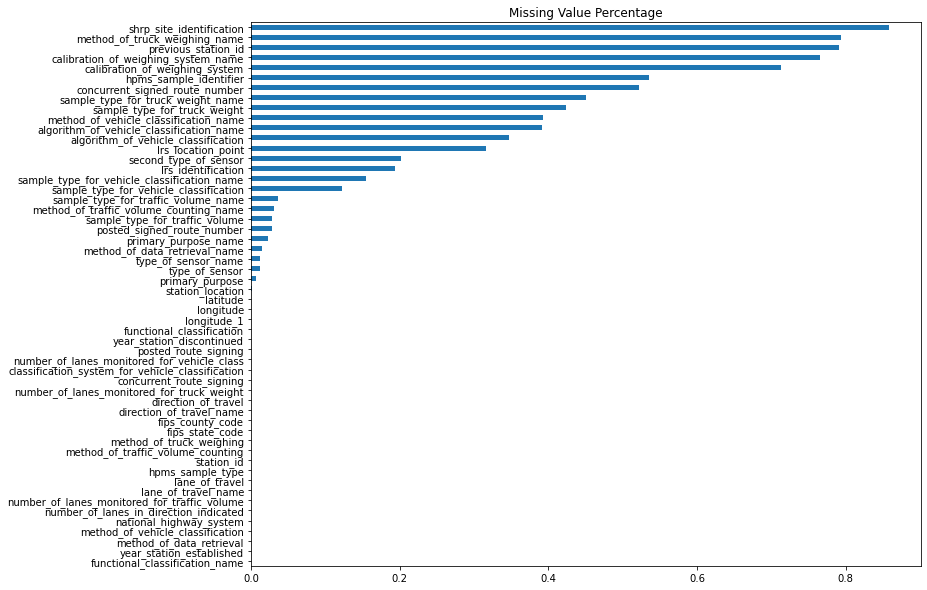

In [21]:
plot_missing_bar(df_station, figsize=(12,10))

Seems like either:
- there are station id change to another station id.
- or the previous station id is known just the indicating the previous station.

In [22]:
df_station.station_id.isin(df_station.previous_station_id.dropna()).any()

True

In [23]:
mask = df_station.previous_station_id.notna()
df_station.loc[mask, :].head()

,algorithm_of_vehicle_classification,algorithm_of_vehicle_classification_name,calibration_of_weighing_system,calibration_of_weighing_system_name,classification_system_for_vehicle_classification,concurrent_route_signing,concurrent_signed_route_number,direction_of_travel,direction_of_travel_name,fips_county_code,fips_state_code,functional_classification,functional_classification_name,hpms_sample_identifier,hpms_sample_type,lane_of_travel,lane_of_travel_name,latitude,longitude,lrs_identification,lrs_location_point,method_of_data_retrieval,method_of_data_retrieval_name,method_of_traffic_volume_counting,method_of_traffic_volume_counting_name,method_of_truck_weighing,method_of_truck_weighing_name,method_of_vehicle_classification,method_of_vehicle_classification_name,national_highway_system,number_of_lanes_in_direction_indicated,number_of_lanes_monitored_for_traffic_volume,number_of_lanes_monitored_for_truck_weight,number_of_lanes_monitored_for_vehicle_class,posted_route_signing,posted_signed_route_number,previous_station_id,primary_purpose,primary_purpose_name,sample_type_for_traffic_volume,sample_type_for_traffic_volume_name,sample_type_for_truck_weight,sample_type_for_truck_weight_name,sample_type_for_vehicle_classification,sample_type_for_vehicle_classification_name,second_type_of_sensor,shrp_site_identification,station_id,station_location,type_of_sensor,type_of_sensor_name,year_station_discontinued,year_station_established,longitude_1
9,NaN,NaN,NaN,NaN,13,2,00000017,5,South,177,51,1U,Urban: Principal Arterial - Interstate,NaN,N,0,Data with lanes combined,38.247320,77.507210,000000000000,0.0,2,Automated (telemetry),3,Permanent automatic traffic recorder (ATR),0,NaN,0,NaN,Y,3,3,0,0,1,00000095,000000,O,Operations purposes but not ITS,T,Station used for Traffic Volume Trends,N,Station not used for any of the above,N,Station not used for Heavy Vehicle Travel Info...,X,NaN,160004,I-95 SOUTH SHOULDER @ MM 126.8,X,Radio wave,0,9,-77.507210
11,NaN,NaN,NaN,NaN,15,3,00000045,5,South,101,12,3U,Urban: Principal Arterial - Other,NaN,N,2,Other lanes,28.189800,82.465810,001401000000,2111.0,2,Automated (telemetry),3,Permanent automatic traffic recorder (ATR),0,NaN,0,NaN,Y,4,4,0,0,2,00000041,000013,P,Planning or traffic statistics purposes,T,Station used for Traffic Volume Trends,N,Station not used for any of the above,NaN,NaN,P,0000,140013,SR-45/US-410.4 MI. N OF DALE,L,Inductance loop,0,38,-82.465810
27,F,Axle spacing with Scheme F,NaN,NaN,15,3,00000093,1,North,101,12,1U,Urban: Principal Arterial - Interstate,141400004498,Y,2,Other lanes,28.207220,82.377200,001414000000,4249.0,2,Automated (telemetry),3,Permanent automatic traffic recorder (ATR),0,NaN,3,Permanent vehicle classification device,Y,4,4,0,4,1,00000075,000190,P,Planning or traffic statistics purposes,T,Station used for Traffic Volume Trends,N,Station not used for any of the above,H,Station used for Heavy Vehicle Travel Informat...,L,0000,140190,SR-93/I-75 1.0 MI N OF SR-56,P,Piezoelectric,0,91,-82.377200
28,G,Axle spacing with Scheme F modified,C,Combination of test trucks and trucks from the...,14,0,NaN,7,West,39,34,3U,Urban: Principal Arterial - Other,NaN,N,1,Outside (rightmost) lane,40.738514,74.367664,00000124--00,7440.0,2,Automated (telemetry),3,Permanent automatic traffic recorder (ATR),5,Permanent weigh-in-motion system,3,Permanent vehicle classification device,N,2,2,2,2,3,00000124,3-1-24,P,Planning or traffic statistics purposes,T,Station used for Traffic Volume Trends,T,Station used for TMG sample (but not SHRP/LTPP...,H,Station used for Heavy Vehicle Travel Informat...,L,NaN,000124,MP 7.6 Summit City Union Cou,P,Piezoelectric,0,4,-74.367664
33,F,Axle spacing with Scheme F,T,Test trucks only,15,3,00000025,5,South,86,12,3U,Urban: Principal Arterial - Other,NaN,N,1,Outside (rightmost) lane,25.873490,80.349100,008709000000,13036.0,2,Automated (telemetry),3,Permanent automatic traffic recorder (ATR),5,Permanent weigh-in-motion system,3,Permanent vehicle classification device,Y,3,

In [24]:
mask = df_station.station_id == '000000'
df_station.loc[mask, :]

,algorithm_of_vehicle_classification,algorithm_of_vehicle_classification_name,calibration_of_weighing_system,calibration_of_weighing_system_name,classification_system_for_vehicle_classification,concurrent_route_signing,concurrent_signed_route_number,direction_of_travel,direction_of_travel_name,fips_county_code,fips_state_code,functional_classification,functional_classification_name,hpms_sample_identifier,hpms_sample_type,lane_of_travel,lane_of_travel_name,latitude,longitude,lrs_identification,lrs_location_point,method_of_data_retrieval,method_of_data_retrieval_name,method_of_traffic_volume_counting,method_of_traffic_volume_counting_name,method_of_truck_weighing,method_of_truck_weighing_name,method_of_vehicle_classification,method_of_vehicle_classification_name,national_highway_system,number_of_lanes_in_direction_indicated,number_of_lanes_monitored_for_traffic_volume,number_of_lanes_monitored_for_truck_weight,number_of_lanes_monitored_for_vehicle_class,posted_route_signing,posted_signed_route_number,previous_station_id,primary_purpose,primary_purpose_name,sample_type_for_traffic_volume,sample_type_for_traffic_volume_name,sample_type_for_truck_weight,sample_type_for_truck_weight_name,sample_type_for_vehicle_classification,sample_type_for_vehicle_classification_name,second_type_of_sensor,shrp_site_identification,station_id,station_location,type_of_sensor,type_of_sensor_name,year_station_discontinued,year_station_established,longitude_1
447,NaN,NaN,NaN,NaN,13,0,NaN,7,West,39,34,4U,Urban: Minor Arterial,NaN,N,1,Outside (rightmost) lane,0.0,0.0,NaN,NaN,2,Automated (telemetry),0,NaN,0,NaN,0,NaN,Y,1,1,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,000000,Bet US 19 Spring St and NJ 81,I,Infrared,0,99,-0.0


So, the previous station id meant that the station that is before this station. So they are interconnected instead of the id change from old to new.

#### Traffic

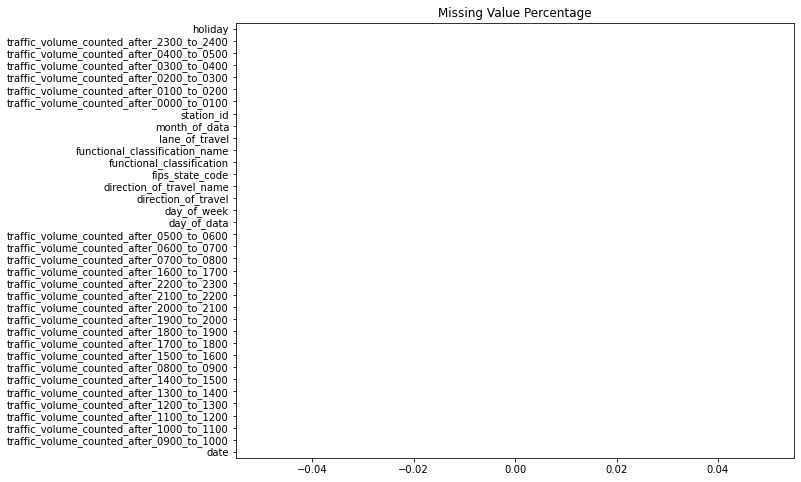

In [25]:
plot_missing_bar(df_traffic, figsize=(10,8))

No missing values in traffic data.

# EDA

## General EDA

### Traffic

In [26]:
pattern = 'traffic_volume_counted'
tv_cols = [x for x in df_traffic.columns if re.findall(pattern, x) != []]
print(tv_cols)

['traffic_volume_counted_after_0000_to_0100', 'traffic_volume_counted_after_0100_to_0200', 'traffic_volume_counted_after_0200_to_0300', 'traffic_volume_counted_after_0300_to_0400', 'traffic_volume_counted_after_0400_to_0500', 'traffic_volume_counted_after_0500_to_0600', 'traffic_volume_counted_after_0600_to_0700', 'traffic_volume_counted_after_0700_to_0800', 'traffic_volume_counted_after_0800_to_0900', 'traffic_volume_counted_after_0900_to_1000', 'traffic_volume_counted_after_1000_to_1100', 'traffic_volume_counted_after_1100_to_1200', 'traffic_volume_counted_after_1200_to_1300', 'traffic_volume_counted_after_1300_to_1400', 'traffic_volume_counted_after_1400_to_1500', 'traffic_volume_counted_after_1500_to_1600', 'traffic_volume_counted_after_1600_to_1700', 'traffic_volume_counted_after_1700_to_1800', 'traffic_volume_counted_after_1800_to_1900', 'traffic_volume_counted_after_1900_to_2000', 'traffic_volume_counted_after_2000_to_2100', 'traffic_volume_counted_after_2100_to_2200', 'traffic_

In [ ]:
for i in range(0, len(tv_cols), 6):
    df_traffic.loc[:, f'before_{i+6}'] = df_traffic.loc[:, tv_cols[i:(i+6)]].sum(axis=1)

In [27]:
df_traffic.describe(include='all')

/tmp/ipykernel_1931/3236631575.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df_traffic.describe(include='all')


,date,day_of_data,day_of_week,direction_of_travel,direction_of_travel_name,fips_state_code,functional_classification,functional_classification_name,lane_of_travel,month_of_data,station_id,traffic_volume_counted_after_0000_to_0100,traffic_volume_counted_after_0100_to_0200,traffic_volume_counted_after_0200_to_0300,traffic_volume_counted_after_0300_to_0400,traffic_volume_counted_after_0400_to_0500,traffic_volume_counted_after_0500_to_0600,traffic_volume_counted_after_0600_to_0700,traffic_volume_counted_after_0700_to_0800,traffic_volume_counted_after_0800_to_0900,traffic_volume_counted_after_0900_to_1000,traffic_volume_counted_after_1000_to_1100,traffic_volume_counted_after_1100_to_1200,traffic_volume_counted_after_1200_to_1300,traffic_volume_counted_after_1300_to_1400,traffic_volume_counted_after_1400_to_1500,traffic_volume_counted_after_1500_to_1600,traffic_volume_counted_after_1600_to_1700,traffic_volume_counted_after_1700_to_1800,traffic_volume_counted_after_1800_to_1900,traffic_volume_counted_after_1900_to_2000,traffic_volume_counted_after_2000_to_2100,traffic_volume_counted_after_2100_to_2200,traffic_volume_counted_after_2200_to_2300,traffic_volume_counted_after_2300_to_2400,holiday
count,7140391,7.140391e+06,7.140391e+06,7.140391e+06,7140391,7140391.0,7140391,7140391,7.140391e+06,7.140391e+06,7140391,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7.140391e+06,7140391
unique,365,NaN,NaN,NaN,10,51.0,12,12,NaN,NaN,5142,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,2015-04-18 00:00:00,NaN,NaN,NaN,North,12.0,1U,Urban: Principal Arterial - Interstate,NaN,NaN,000050,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
freq,21127,NaN,NaN,NaN,2013229,606310.0,1702277,1702277,NaN,NaN,15013,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6925912
first,2015-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2015-12-31 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,1.572650e+01,4.013872e+00,3.883486e+00,NaN,NaN,NaN,NaN,1.291672e+00,6.520263e+00,NaN,1.145878e+02,7.874558e+01,6.622503e+01,7.016138e+01,1.171851e+02,2.454065e+02,4.334301e+02,5.833799e+02,5.774976e+02,5.600694e+02,5.811083e+02,6.184133e+02,6.501346e+02,6.635075e+02,7.009825e+02,7.497160e+02,7.770437e+02,7.565536e+02,6.173322e+02,4.793756e+02,3.906426e+02,3.274747e+02,2.534447e+02,1.798298e+02,NaN
std,NaN,8.769343e+00,1.997511e+00,2.286816e+00,NaN,NaN,NaN,NaN,1.080419e+00,3.455234e+00,NaN,2.818492e+02,2.202875e+02,2.102642e+02,2.242483e+02,3.227085e+02,5.723301e+02,8.359078e+02,9.984941e+02,9.594217e+02,8.917308e+02,8.970572e+02,9.371717e+02,1.001836e+03,1.024515e+03,1.092236e+03,1.143318e+03,1.173933e+03,1.172116e+03,1.061545e+03,9.203711e+02,8.290271e+02,7.989146e+02,7.284074e+02,6.901713e+02,NaN
min,NaN,1.000000e+00,1.000000e+00,0.000000e+00,NaN,NaN,NaN,NaN,0.000000e+00,1.000000e+00,NaN,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-3.061000e+03,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,NaN
25%,NaN,8.000000e+00,2.000000e+00,1.000000e+00,NaN,NaN,NaN,NaN,1.000000e+00,4.000000e+00,NaN,1.300000e+01,8.000000e+00,7.000000e+00,7.000000e+00,1.200000e+01,2.800000e+01,5.600000e+01,9.000000e+01,1.070000e+02,1.230000e+02,1.370000e+02,1.490000

From the descriptive statistics, we can observe that
- the lane of travel can up to 9 which is matching with the direction of travel
- fips_state_code, 12 is having the most entries.
- functional classification name, urban: principal arterial - interstate have the most entries
- station_id 000050 having the most entries.

In [28]:
df_traffic

,date,day_of_data,day_of_week,direction_of_travel,direction_of_travel_name,fips_state_code,functional_classification,functional_classification_name,lane_of_travel,month_of_data,station_id,traffic_volume_counted_after_0000_to_0100,traffic_volume_counted_after_0100_to_0200,traffic_volume_counted_after_0200_to_0300,traffic_volume_counted_after_0300_to_0400,traffic_volume_counted_after_0400_to_0500,traffic_volume_counted_after_0500_to_0600,traffic_volume_counted_after_0600_to_0700,traffic_volume_counted_after_0700_to_0800,traffic_volume_counted_after_0800_to_0900,traffic_volume_counted_after_0900_to_1000,traffic_volume_counted_after_1000_to_1100,traffic_volume_counted_after_1100_to_1200,traffic_volume_counted_after_1200_to_1300,traffic_volume_counted_after_1300_to_1400,traffic_volume_counted_after_1400_to_1500,traffic_volume_counted_after_1500_to_1600,traffic_volume_counted_after_1600_to_1700,traffic_volume_counted_after_1700_to_1800,traffic_volume_counted_after_1800_to_1900,traffic_volume_counted_after_1900_to_2000,traffic_volume_counted_after_2000_to_2100,traffic_volume_counted_after_2100_to_2200,traffic_volume_counted_after_2200_to_2300,traffic_volume_counted_after_2300_to_2400,holiday
0,2015-04-07,7,3,1,North,56,3R,Rural: Principal Arterial - Other,1,4,000084,4,3,2,4,43,78,116,144,132,115,150,184,169,136,129,89,122,124,110,69,73,28,12,6,False
1,2015-09-26,26,7,7,West,21,1U,Urban: Principal Arterial - Interstate,2,9,056P94,381,252,218,194,220,348,453,679,826,962,1158,1379,1376,1383,1453,1617,1669,1308,1068,928,885,798,650,613,False
2,2015-06-16,16,3,3,East,6,1U,Urban: Principal Arterial - Interstate,0,6,077590,585,408,328,364,696,1929,4228,5634,5673,4636,3925,3827,4049,3954,4077,4244,4405,4609,4361,3272,2243,2050,1453,892,False
3,2015-04-26,26,1,5,South,55,1U,Urban: Principal Arterial - Interstate,1,4,450001,105,73,68,66,77,113,254,367,487,668,870,996,1003,1000,1043,1011,959,851,708,559,457,297,207,110,False
4,2015-05-23,23,7,3,East,4,4R,Rural: Minor Arterial,0,5,102210,6,4,2,3,1,10,17,52,64,68,82,96,99,87,87,83,61,55,35,29,21,23,9,7,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7140386,2015-01-25,25,1,5,South,41,4R,Rural: Minor Arterial,0,1,024020,7,7,1,1,2,7,9,21,33,44,59,58,79,69,61,63,61,50,48,37,16,17,5,4,False
7140387,2015-10-08,8,5,7,West,53,1U,Urban: Principal Arterial - Interstate,2,10,P29AAA,12,12,5,18,48,191,377,533,454,389,401,497,511,621,697,871,986,970,534,347,209,141,80,57,False
7140388,2015-05-25,25,2,3,East,15,1U,Urban: Principal Arterial - Interstate,5,5,001162,81,46,86,199,388,564,586,518,539,649,704,735,679,719,670,609,621,560,485,340,307,272,152,110,True
7140389,2015-10-07,7,4,3,East,48,1U,Urban: Principal Arterial - Interstate,0,10,000165,664,458,485,557,1367,4556,7352,6882,6782,6185,5397,5539,5712,5880,5999,7059,6286,4962,6293,4786,3295,2764,2148,1175,False


From the table, we found out that
- there are lane of travel of 0, yet there are having car to pass by.
- some of the station have up to direction of travel.
- day of week is given, so possibly we can compare both weekdays and weekend (day of week start with 1 which is a sunday) - might require some checking.

In [29]:
# validate if the given day of week column is correct
assert ((df_traffic.date.dt.dayofweek + 2).replace(8, 1) == df_traffic.day_of_week).all()

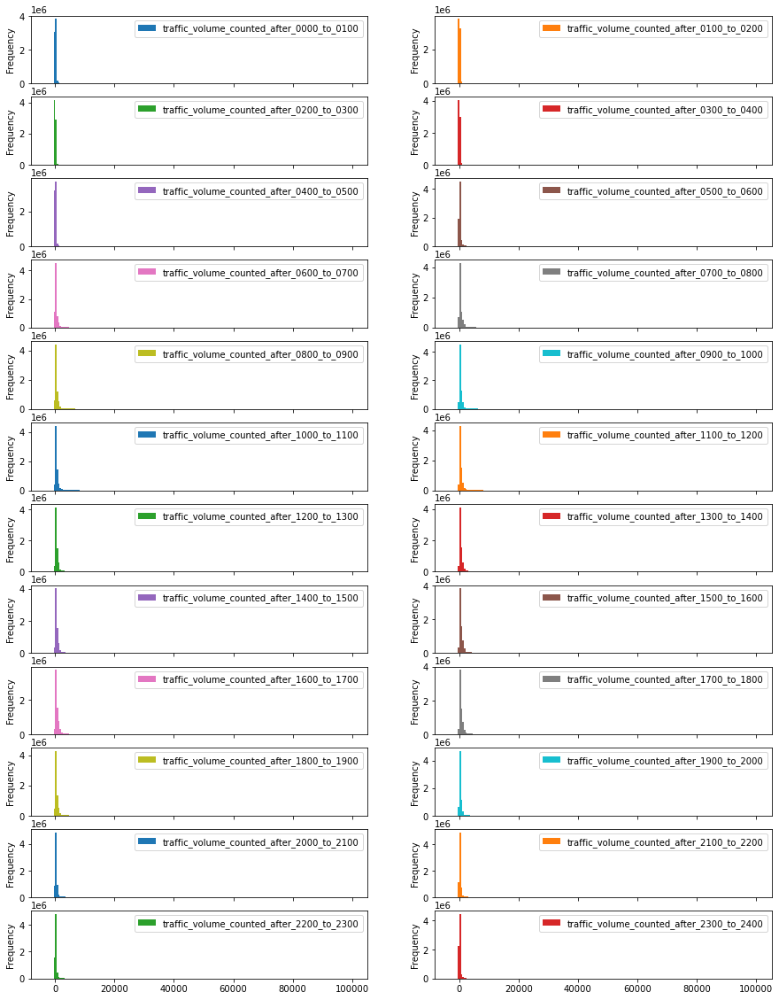

In [30]:
df_traffic.loc[:, tv_cols].plot(kind='hist', figsize=(15,20), subplots=True, layout=(12, 2), bins=200)
plt.show()

Generally it's all right skewed.

Based on these findings, we can
- aggregate traffic volume mean or median or sum by date while retaining per hour columns
- finding out what date is having higher traffic volume compare to other days
- aggregate traffic volumn mean or median or sum by station id while retaining per hour columns

The feature engineering can be
- aggregate the hours on 6 hours basis
- checking if it's holiday
- weather (season)

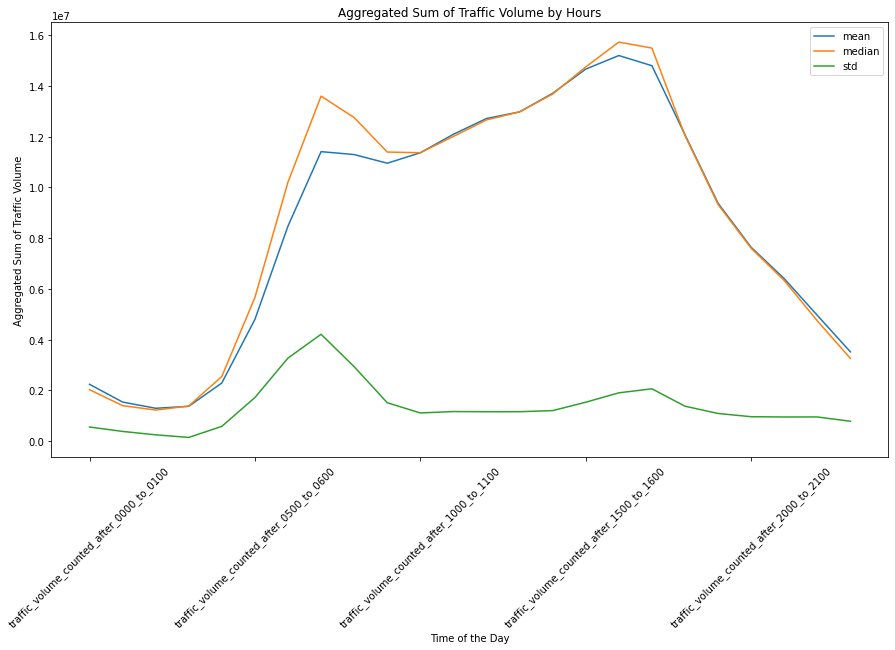

In [31]:
index = 'date'
df_temp = df_traffic.groupby(index)[tv_cols].sum()
plt.figure(figsize=(15,8))
df_temp.mean().plot(rot=45, label='mean')
df_temp.median().plot(rot=45, label='median')
df_temp.std().plot(rot=45, label='std')
plt.title('Aggregated Sum of Traffic Volume by Hours')
plt.ylabel('Aggregated Sum of Traffic Volume')
plt.xlabel('Time of the Day')
plt.legend()
plt.show()

#### Finding 1
This is the most obvious general trend where there are always a peak around 6am-7am and 4pm-6pm, which we can also see the standard deviationis fluctuated around that time but the deviation is lower than the mean and median.

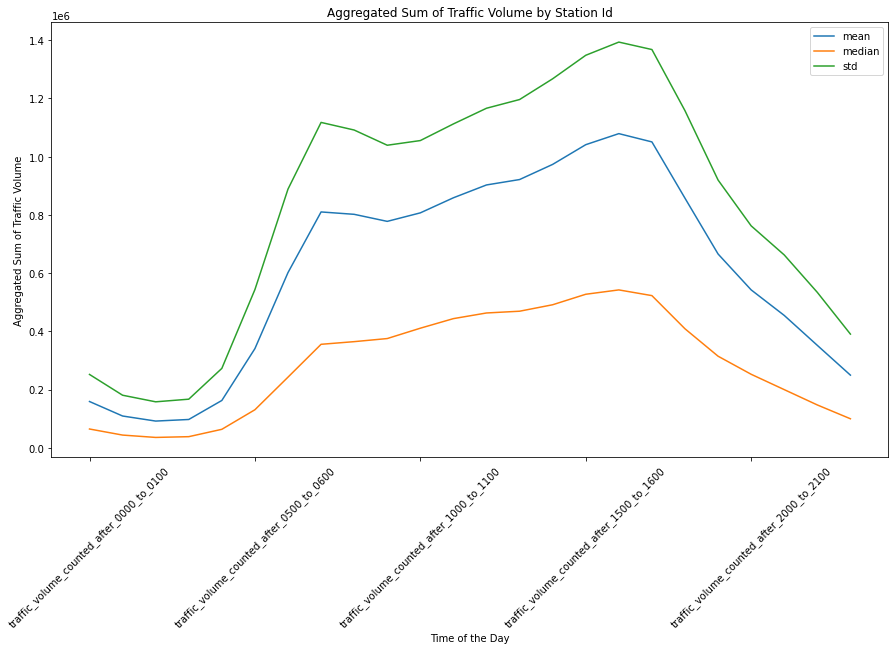

In [32]:
index = 'station_id'
df_temp = df_traffic.groupby(index)[tv_cols].sum()
# df_temp.sum().sum().plot(rot=45)
plt.figure(figsize=(15,8))
df_temp.mean().plot(rot=45, label='mean')
df_temp.median().plot(rot=45, label='median')
df_temp.std().plot(rot=45, label='std')
plt.title('Aggregated Sum of Traffic Volume by Station Id')
plt.ylabel('Aggregated Sum of Traffic Volume')
plt.xlabel('Time of the Day')
plt.legend()
plt.show()

#### Finding 2
We can observe the trend is similar with the plot by date. However, the standard deviation is way higher than mean and median, which indicate the traffic volume have a huge deviation when compare station by station, which is worth to investigate which stations are the one contribute the most.

## Top 10 Station ID by Traffic Volume

In [33]:
index = 'station_id'
df_temp = df_traffic.groupby(index)[tv_cols].sum()
traffic_volume_by_station_id = df_temp.sum(axis=1).sort_values(ascending=False)
traffic_volume_by_station_id.head(10)

station_id
000126    190698152
000580    165626517
000315    156667146
000050    152914286
000C7L    152265416
100106    149220079
000012    146440208
000124    141344808
930198    138963211
000004    135067417
dtype: int64

In [34]:
index = ['station_id', 'direction_of_travel_name', 'fips_state_code']
df_traffic.groupby(index)[tv_cols].sum().sum(axis=1).sort_values(ascending=False).head(10)

station_id  direction_of_travel_name  fips_state_code
000C7L      East                      15                 81874998
190057      South                     51                 74998615
090138      North                     51                 74014729
000C7L      West                      15                 70390418
930198      North                     12                 69979535
            South                     12                 68983676
930174      North                     12                 68332671
860163      South                     12                 66795769
P1SAAA      South                     53                 66764737
P1NAAA      North                     53                 66676779
dtype: int64

From here itself we knew that some of the station id having a high traffic flow is due to the interconnection nature of their station. However, when we are comparing a certain direction, the top 10 station id change to another set except a few of them.

In [35]:
# plotting folium map to have middle location
lat = df_station1.latitude.mean()
lng = df_station1.longitude_1.mean()

map_station = folium.Map(location=(lat, lng), zoom_start=3)
df_temp = df_station1.dropna(subset=['latitude', 'longitude_1'])

# taking only top 10 station id to check where is it located
# filtered those invalid longitude that is shown in Basic EDA
mask1 = df_temp.station_id.isin(traffic_volume_by_station_id.head(10).index)
mask2 = df_temp.longitude_1 >= -180
mask = mask1 & mask2
df_temp = df_temp.loc[mask, :]
df_temp.apply(lambda row:folium.CircleMarker(location=[row["latitude"], row["longitude_1"]], 
                                             radius=10, popup=row[['station_id','station_location', 'latitude', 'longitude_1']])
              .add_to(map_station), axis=1)
display(map_station)

From the map itself we can see 
- It is from the united state central region. 
- Notice that the circle plot on the map is more than 10. This meant that one station have multiple data points and connecting to other routes which can be validate.

In [36]:
df_temp.groupby('station_id')['latitude'].count()

station_id
000004    49
000012    50
000050    45
000124    43
000126    40
000315    30
000580    16
000C7L    13
100106    11
930198    12
Name: latitude, dtype: int64

In [37]:
# plotting folium map to have middle location
lat = df_station1.latitude.mean()
lng = df_station1.longitude_1.mean()

map_station = folium.Map(location=(lat, lng), zoom_start=3)
df_temp = df_station1.dropna(subset=['latitude', 'longitude_1'])

# taking only last 10 station id to check where is it located
# filtered those invalid longitude that is shown in Basic EDA
mask1 = df_temp.station_id.isin(traffic_volume_by_station_id.tail(10).index)
mask2 = df_temp.longitude_1 >= -180
mask = mask1 & mask2
df_temp = df_temp.loc[mask, :]
df_temp.apply(lambda row:folium.CircleMarker(location=[row["latitude"], row["longitude_1"]], 
                                             radius=10, popup=row[['station_id','station_location', 'latitude', 'longitude_1']])
              .add_to(map_station), axis=1)
display(map_station)

Based on the circle plot here, we noticed that the there are 11 circle, which then these indicates that the map that showing top 10 station id just now is affected by directions itself.

## Top 10 Station Id with Direction by Traffic Volume

In [38]:
index = ['station_id', 'direction_of_travel_name', 'fips_state_code']
top_10_station_id_direction = df_traffic.groupby(index)[tv_cols].sum().sum(axis=1).sort_values(ascending=False).head(10).reset_index()
top_10_station_id_direction = top_10_station_id_direction.rename(columns={0:'traffic_volume_sum'})

In [39]:
# plotting folium map to have middle location
lat = df_station1.latitude.mean()
lng = df_station1.longitude_1.mean()

map_station = folium.Map(location=(lat, lng), zoom_start=3)
df_temp = df_station1.dropna(subset=['latitude', 'longitude_1'])

# taking only last 10 station id to check where is it located
# filtered those invalid longitude that is shown in Basic EDA
df_temp = pd.merge(df_temp, top_10_station_id_direction, on=index)
mask = df_temp.longitude_1 >= -180
df_temp = df_temp.loc[mask, :]
df_temp.apply(lambda row:folium.CircleMarker(location=[row["latitude"], row["longitude_1"]], 
                                             radius=10, popup=row[['station_id','station_location', 'latitude', 'longitude_1']])
              .add_to(map_station), axis=1)

display(map_station)

## Top 5 State by Traffic Volume

In [40]:
index = ['fips_state_code']
traffic_volume_by_state = df_traffic.groupby(index)[tv_cols].sum().sum(axis=1).sort_values(ascending=False)

In [41]:
# plotting folium map to have middle location
lat = df_station1.latitude.mean()
lng = df_station1.longitude_1.mean()

map_station = folium.Map(location=(lat, lng), zoom_start=4)
df_temp = df_station1.dropna(subset=['latitude', 'longitude_1'])

# taking only top 10 station id to check where is it located
# filtered those invalid longitude that is shown in Basic EDA
mask1 = df_temp.fips_state_code.isin(traffic_volume_by_state.head(5).index)
mask2 = df_temp.longitude_1 >= -180
mask = mask1 & mask2
df_temp = df_temp.loc[mask, :]
df_temp.apply(lambda row:folium.CircleMarker(location=[row["latitude"], row["longitude_1"]], 
                                             radius=1, popup=row[['station_id','station_location', 'latitude', 'longitude_1']])
              .add_to(map_station), axis=1)

display(map_station)

### Finding 3
We can see there are possibly a lot vehicle within these area which is more to central area.
- Los Angles
- Phoenix
- Washington
- Ohio
- Florida

## Top 5 County by Traffic Volume

In [42]:
index = ['functional_classification_name']
traffic_volume_by_fcn = df_traffic.groupby(index)[tv_cols].sum().sum(axis=1).sort_values(ascending=False)

In [43]:
traffic_volume_by_fcn

functional_classification_name
Urban: Principal Arterial - Interstate                       35655869712
Urban: Principal Arterial - Other Freeways or Expressways    12991843097
Rural: Principal Arterial - Interstate                        9679063143
Urban: Principal Arterial - Other                             8325395130
Rural: Principal Arterial - Other                             5279260200
Urban: Minor Arterial                                         1510731387
Rural: Minor Arterial                                         1291514180
Rural: Major Collector                                         551860424
Urban: Collector                                               255191370
Rural: Minor Collector                                          61046978
Urban: Local System                                             24712769
Rural: Local System                                              6301311
dtype: int64

### Finding 4
There's a lot of traffic flow on urban compare to rural area. But possibly due to there are more route in urban area compared to rural area. Hence we count the number of station id (not unique because we are counting how many connections are there as well)

In [44]:
df_station.groupby('functional_classification_name')['station_id'].count().sort_values(ascending=False)

functional_classification_name
Urban: Principal Arterial - Interstate                       7800
Rural: Principal Arterial - Other                            4837
Urban: Principal Arterial - Other                            4029
Rural: Principal Arterial - Interstate                       3792
Urban: Principal Arterial - Other Freeways or Expressways    3289
Rural: Minor Arterial                                        1871
Rural: Major Collector                                       1167
Urban: Minor Arterial                                        1133
Urban: Collector                                              285
Rural: Minor Collector                                        146
Rural: Local System                                            61
Urban: Local System                                            56
Name: station_id, dtype: int64

Apparently, the station that they are having seems to be having lesser difference than expected. So, the traffic flow is probably caused by the population instead of the road built in rural area.

## Traffic Volume by Date

In [45]:
index = ['date']
group_tv_by_date = df_traffic.groupby(index)[tv_cols]

df_agg_tv_by_date_mean = group_tv_by_date.mean()
df_agg_tv_by_date_median = group_tv_by_date.median()

### Visualization - Line Plot

#### Mean

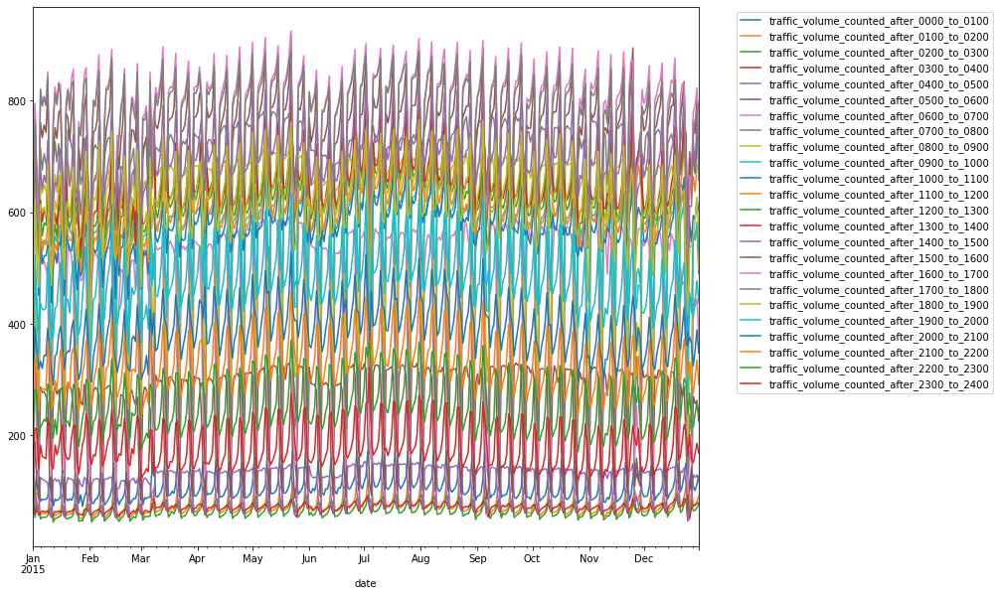

In [46]:
df_agg_tv_by_date_mean.plot(figsize=FIGSIZE)
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()

It seems there's cyclic and seasonal pattern in the plot.

#### Median

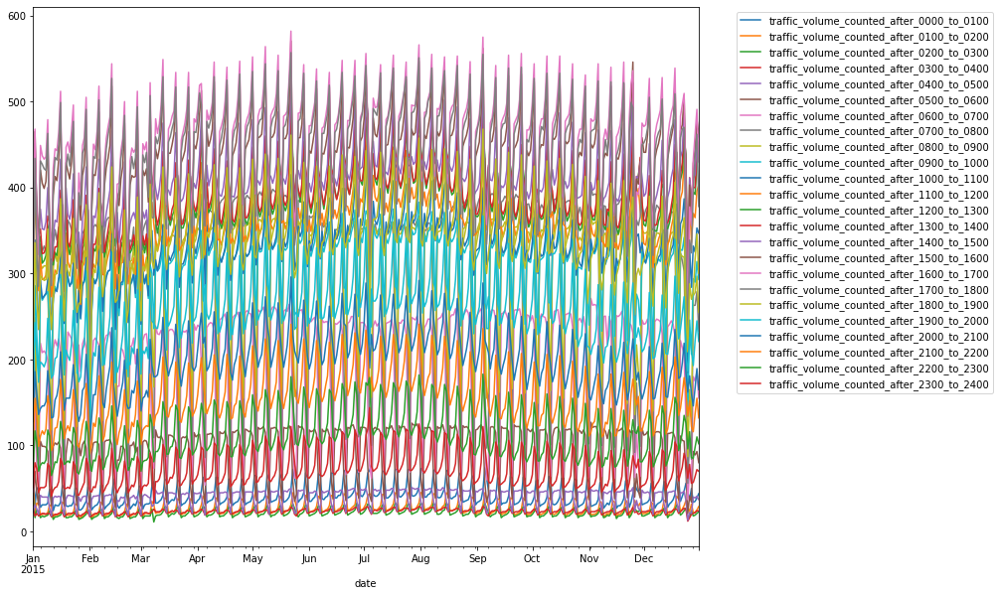

In [47]:
df_agg_tv_by_date_median.plot(figsize=FIGSIZE)
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()

Seems like abit similar to what we have on mean graph except that the maximum range is lower comparitively.
However, we couldn't make a conclusive analysis here. Hence we will move towards to subplot to have a better understanding.

### Visualization - SubPlot for Line

#### Mean

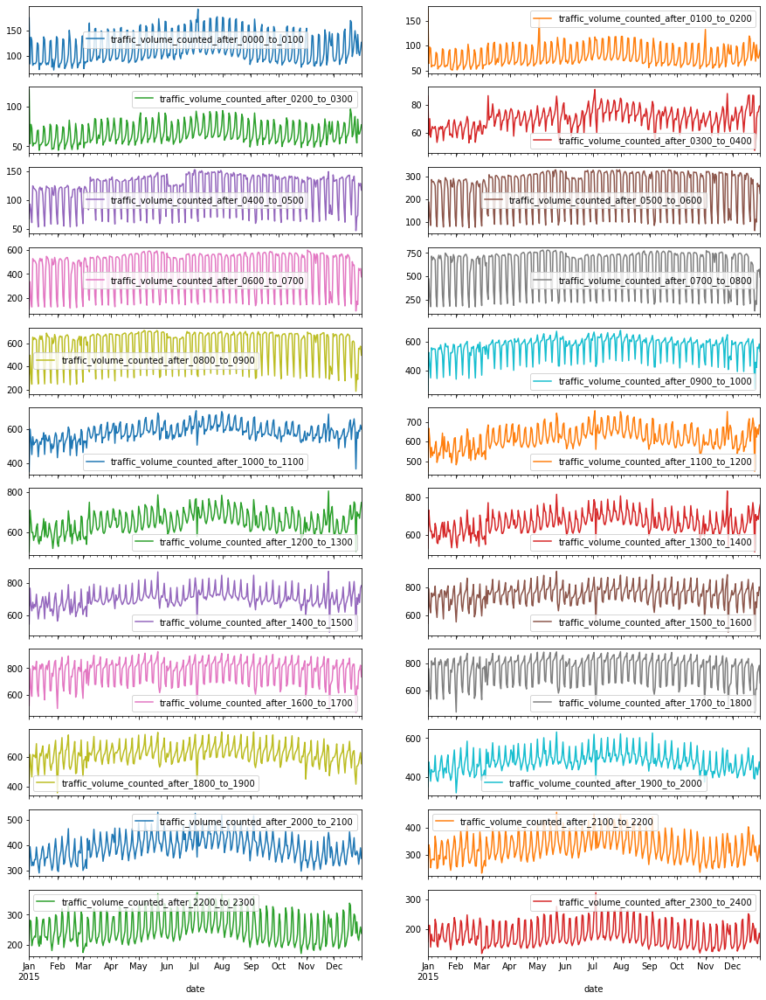

In [48]:
df_agg_tv_by_date_mean.plot(figsize=(15,20), subplots=True, layout=(12, 2))
plt.show()

Due to it's smaller size, hence we might misinterpret certain plot. However this is just to provide an intuition on what we can do next.

From the y axis, we can observe that generally 
- The traffic volume is generally lower from 12am to 5am.
- It started to increase and having a peak around 7am to 8am.
- The trend fell slightly on 8am to 11am then increase again.
- Thre traffic started to decrease from 6pm onwards.


We can observe the trend shape across the date are 
- Generally the same for the traffic volume on 12am to 3am
- However the 4am looks slightly different which seems like a combination of 2am-3am and 4am to 5am.
- 5am to 10am are generally the same as well which we can see there's are relatively flat high peak which are suspected to be weekdays.
- 10am to 6pm are generally the same where there are random peaks, however coincidentally the peak are sometimes fell in the lowest point of 5am to 10am. It's suspected that this part of trend might be influence by holiday and weekend where the traffic volume increased at that time.
- 6pm to 12am have a relatively similar trend.

The fall within every hours of the graph are suspected to be
- weekend where majority of people is not going to work.

#### Median

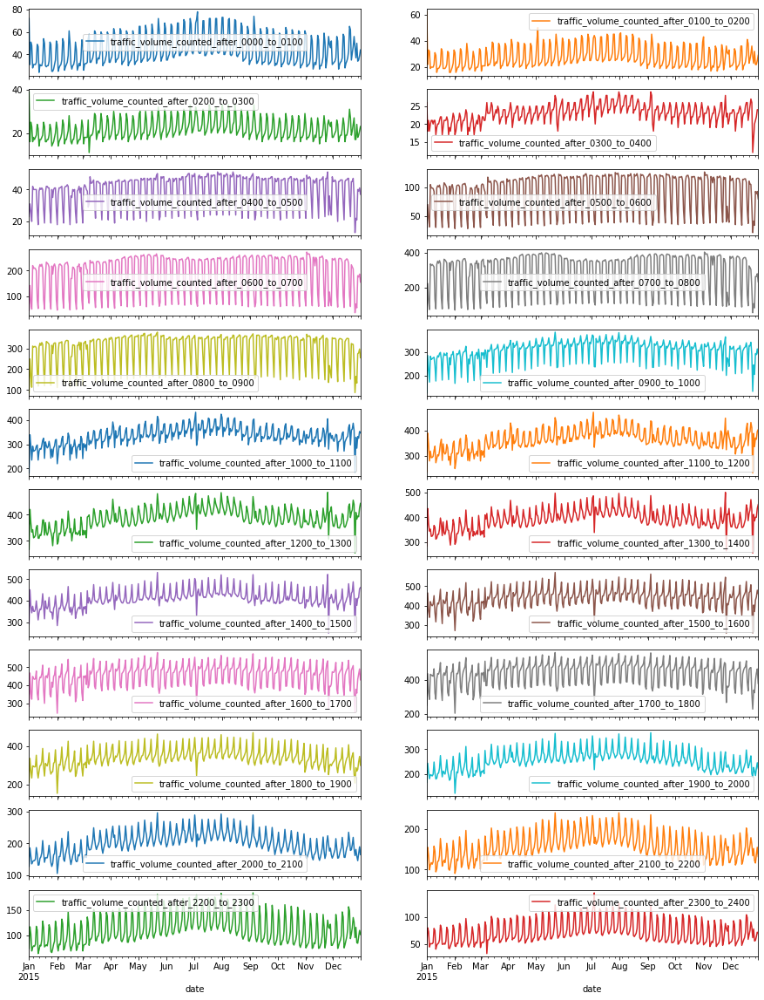

In [49]:
df_agg_tv_by_date_median.plot(figsize=(15,20), subplots=True, layout=(12, 2))
plt.show()

Generally the median traffic volume by date exhibit the same trend, except that the maximum scale value is lower compare to mean traffic volume by date.

### Visualization - Histogram

#### Mean

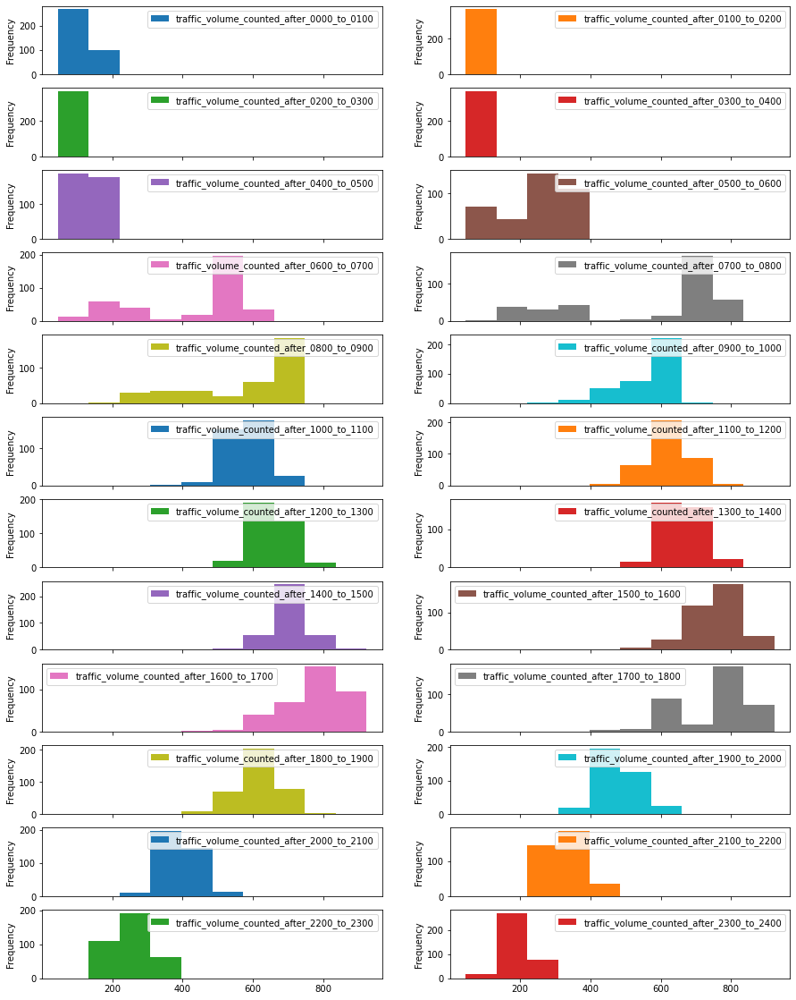

In [50]:
df_agg_tv_by_date_mean.plot(kind='hist', figsize=(15,20), subplots=True, layout=(12, 2))
plt.show()

From this plot, we have more idea on how the traffic volume is distributed.
- we can observe the distribution is shifting to the right slowly until 6pm then shift back to left.

#### Median

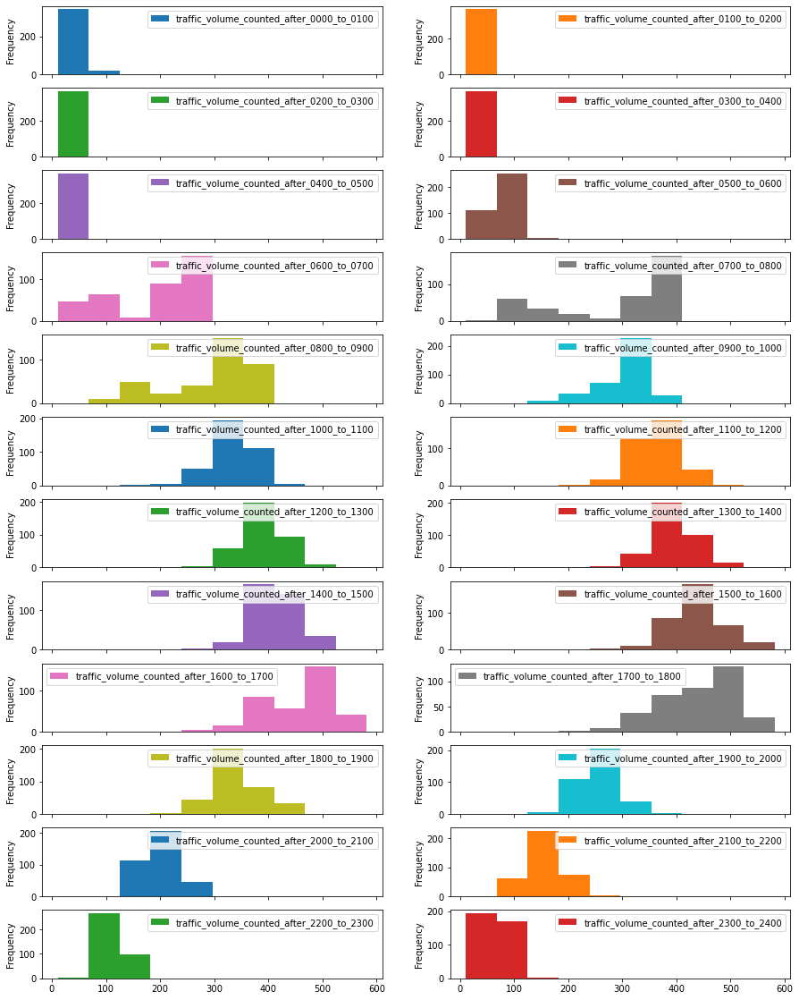

In [51]:
df_agg_tv_by_date_median.plot(kind='hist', figsize=(15,20), subplots=True, layout=(12, 2))
plt.show()

We can observe that the major trend moving from 12am to 12pm is generally the same, but there are certain hours of median traffic volume by date is different with mean traffic volume by date. Majority of them will is telling them there are more frequency in a lower bin, eg. 4am-6am. This probably meant that there are stations on a certain date have a very high amount of traffic volume which then dragging the mean value towards the right of the graph.

### Time Series Clustering

In [52]:
# standardize to reduce the time taken
sc = StandardScaler()
sc_tv_by_date_mean = sc.fit_transform(df_agg_tv_by_date_mean)
print(sc_tv_by_date_mean.shape)

(365, 24)


In [53]:
ts_tv_by_date_mean = to_time_series_dataset(df_agg_tv_by_date_mean)
print(ts_tv_by_date_mean.shape)

(365, 24, 1)


Due to time constraint, we make several assumptions here to shorten the process of evaluation:
- testing cluster number from 2 to 12 instead of 2 to 365 is because that we think one year have 12 months have possibly there wont be such a deviate pattern on every day.
- even though there are other methods such as elbow test, looking at distance between cluster and distance within cluster to measure cluster information, we picked on silhouette score.
- our standardization apparently performed on column basis, which meant it standardize accross the same hour for everyday instead of standardize across everyday. We might need to test on this standardize / checking on difference on traffic flow when we have the time.
- we did not split the train test as we does not have any supervised label here to predict but just to find out the pattern.

 25%|██▌       | 1/4 [00:34<01:42, 34.19s/it]

For n = 2 The average silhouette_score is : 0.5313116391656766


 50%|█████     | 2/4 [00:53<00:50, 25.32s/it]

For n = 3 The average silhouette_score is : 0.3935841910589846


 75%|███████▌  | 3/4 [01:19<00:25, 25.55s/it]

For n = 4 The average silhouette_score is : 0.34589183839513593


100%|██████████| 4/4 [01:40<00:00, 25.01s/it]

For n = 5 The average silhouette_score is : 0.297417602444686


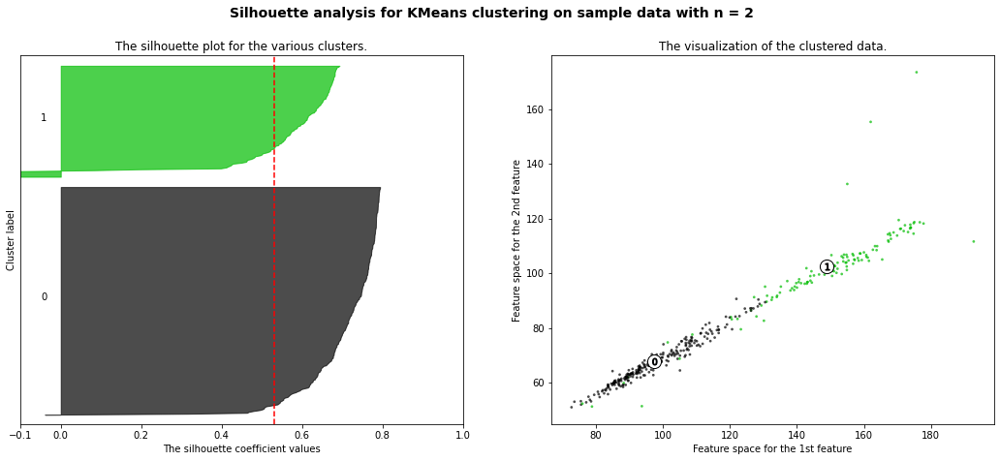

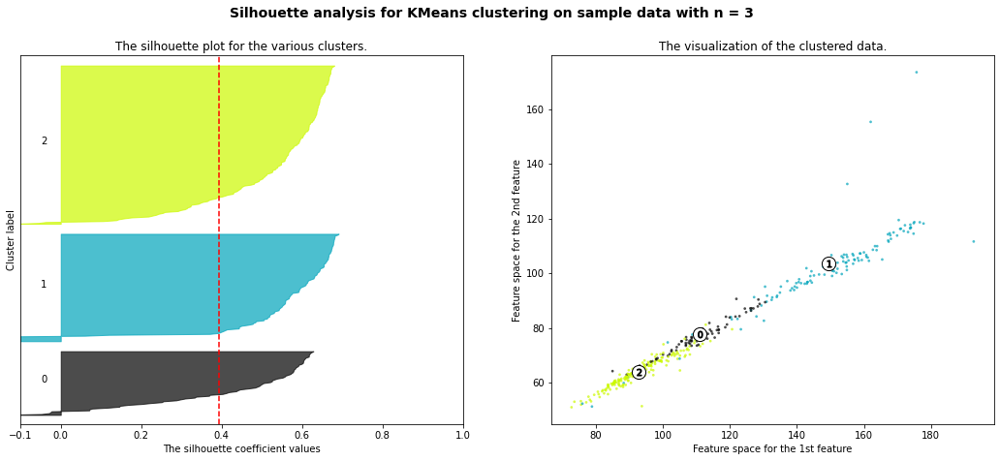

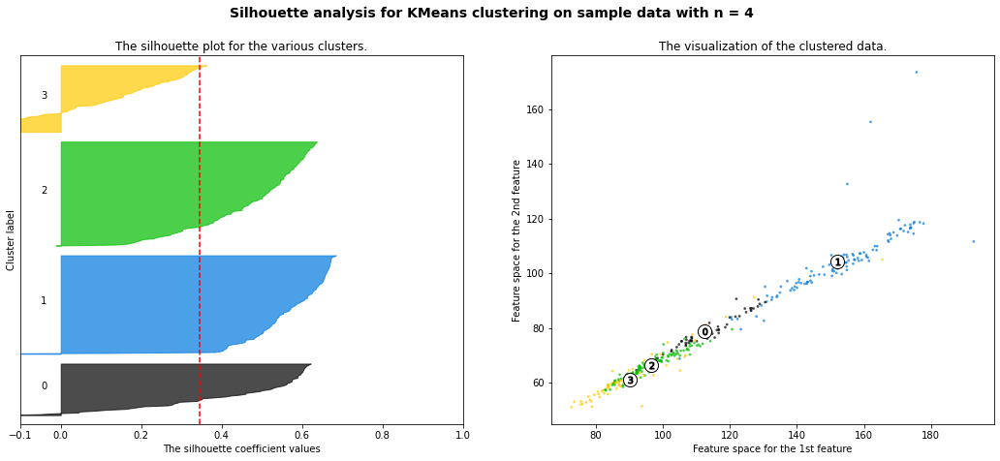

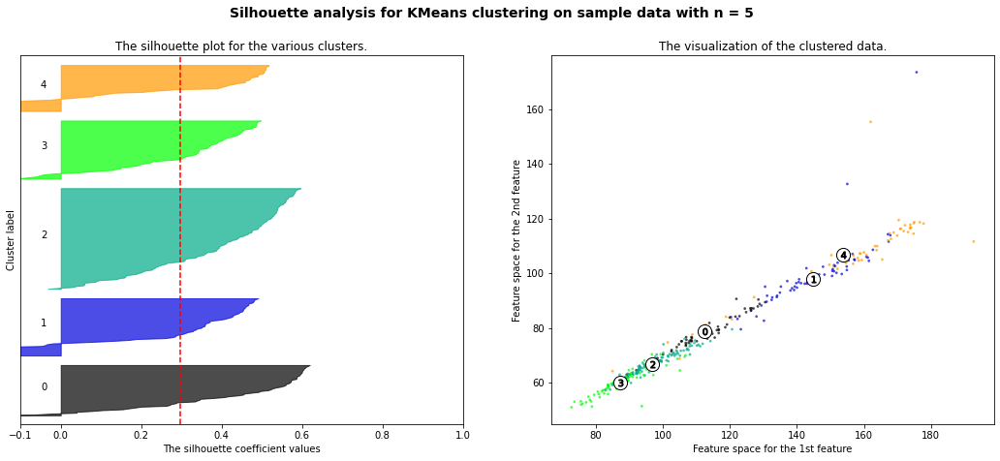

In [54]:
n_clusters = range(2, 6)
plot_silhouette_ts_kmeans(n_clusters, ts_tv_by_date_mean, df_agg_tv_by_date_mean, 'softdtw', SEED, 0, 1)

From the silhoutte plot, it seems cluster number 2 and 3 will be a good pick judging based on
- presense of cluster are above average silhouette score.
- the size of silhouette seems a bit uneven, but based on the visualization the clustering is okay to have it.
- the most even will be size = 3 in this case


 25%|██▌       | 1/4 [00:06<00:19,  6.41s/it]

For n = 2 The average silhouette_score is : 0.5298006966728678


 50%|█████     | 2/4 [00:12<00:12,  6.19s/it]

For n = 3 The average silhouette_score is : 0.3938222158818502


 75%|███████▌  | 3/4 [00:19<00:06,  6.54s/it]

For n = 4 The average silhouette_score is : 0.34688896328995994


100%|██████████| 4/4 [00:28<00:00,  7.08s/it]

For n = 5 The average silhouette_score is : 0.30961478562517103


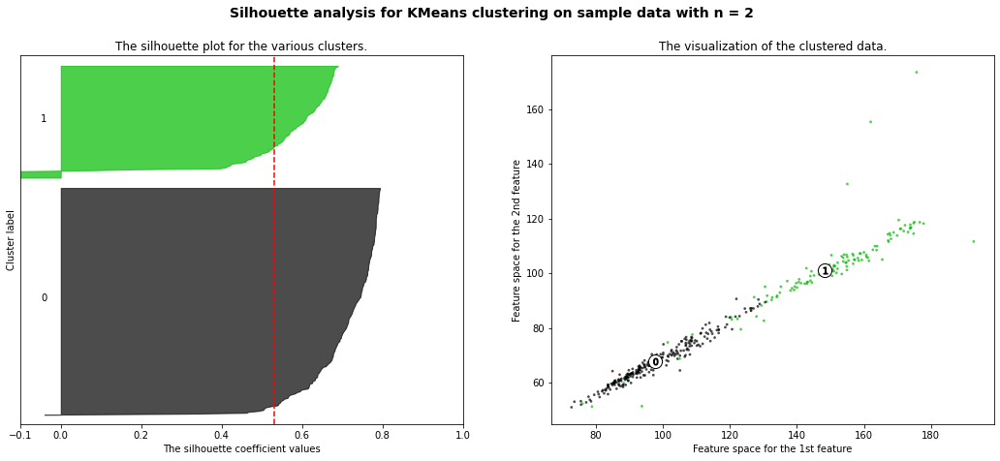

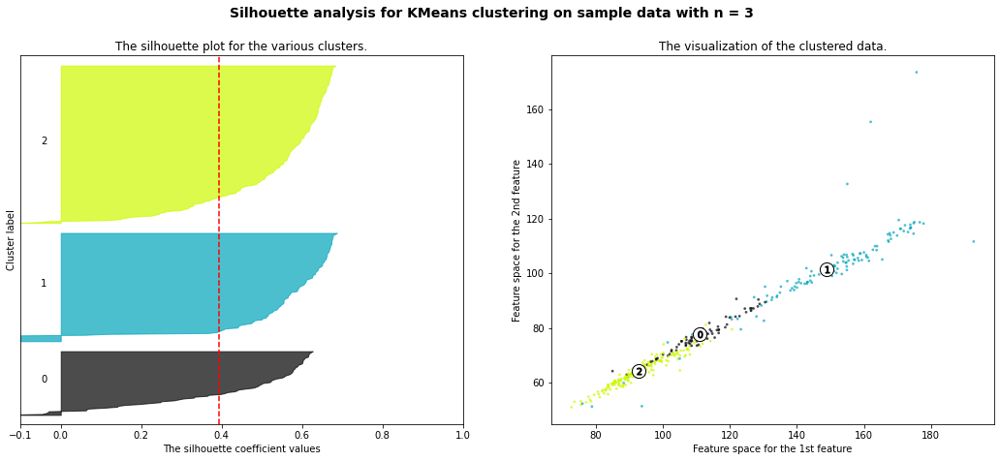

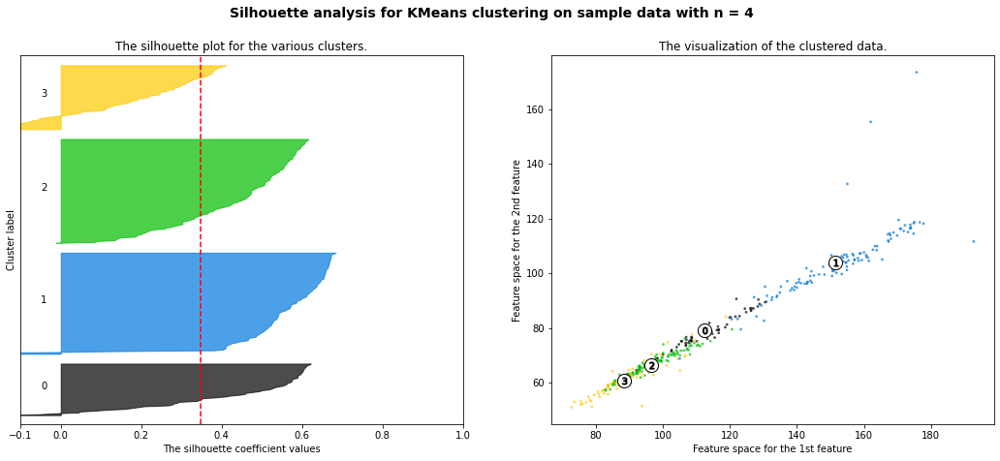

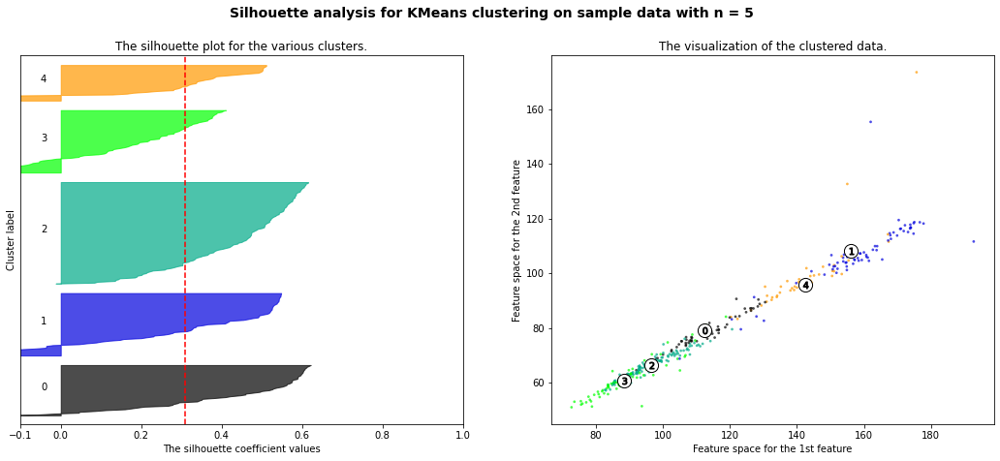

In [55]:
plot_silhouette_ts_kmeans(n_clusters, ts_tv_by_date_mean, df_agg_tv_by_date_mean, 'dtw', SEED, 0, 1)

We came to the same conclusion while using dtw or dtw. Hence, the final n_cluster that we pick is 2 as silhouette average score is higher and also it take lesser computation time.

In [56]:
choosen_n = 2
tskm_tv_by_date = TimeSeriesKMeans(n_clusters=choosen_n, metric='softdtw', random_state=SEED)
tskm_tv_by_date.fit(ts_tv_by_date_mean)
labels_tv_by_date = tskm_tv_by_date.predict(ts_tv_by_date_mean)

Cluster 0


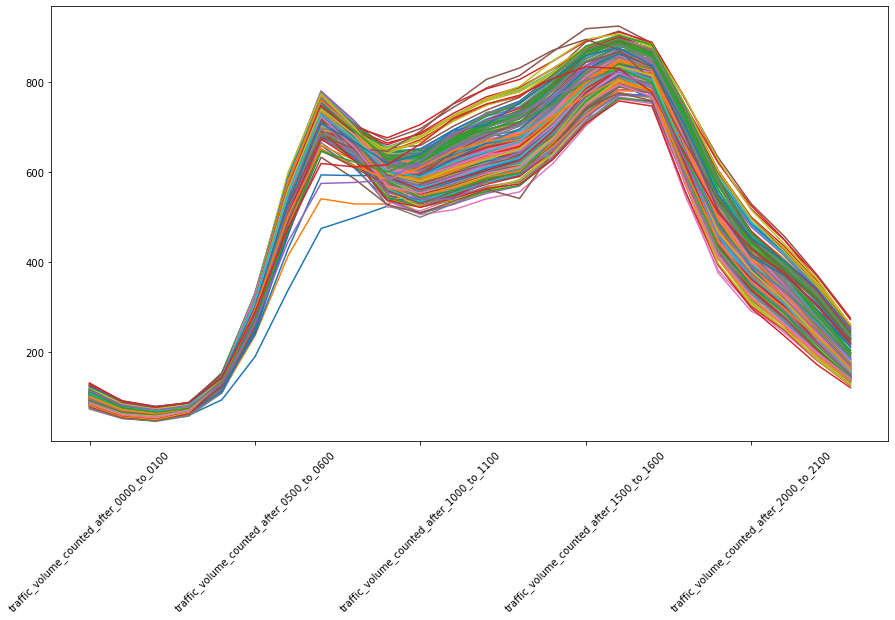

Cluster 1


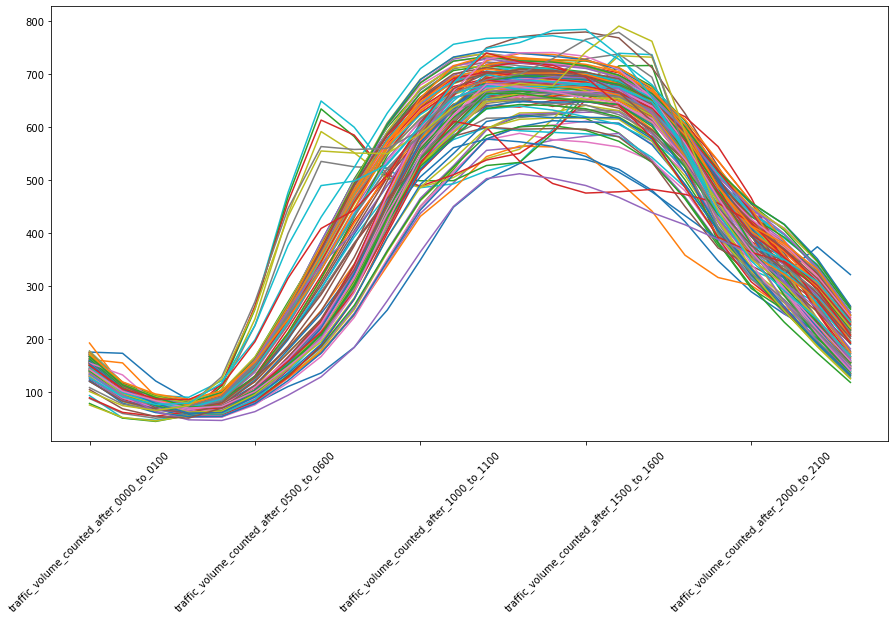

In [57]:
for label in range(0, choosen_n):
    print(f'Cluster {label}')
    mask = labels_tv_by_date == label
    df_temp = df_agg_tv_by_date_mean.loc[mask, :].transpose()
    df_temp.plot(figsize=(15,8), rot=45, legend=False,)    
    plt.show()

Judging from here,
- We can observe the cluster 0 seems to be having some similar pattern, which is two peak and one peak is around 6am to 8am and the other peak will be around 4pm - 6pm. Seems like the typical working hours.
- Cluster 1 is the only one obvious that is having peak hours from 10am-4pm, which seems like the holiday. However there are still part of the cluster 0 data within it.

In [58]:
df_agg_tv_by_date_mean.loc[:, 'holiday'] = df_agg_tv_by_date_mean.index.isin(us_holidays['2015-01-01':'2015-12-31'])
df_agg_tv_by_date_mean.loc[:, 'cluster'] = labels_tv_by_date

In [59]:
mask = df_agg_tv_by_date_mean.cluster == 1
holiday_percentage = df_agg_tv_by_date_mean.loc[mask, 'holiday'].sum() / len(us_holidays['2015-01-01':'2015-12-31'])
print(f'Cluster 1 consist of {holiday_percentage*100:.2f}% of total holidays')

Cluster 1 consist of 72.73% of total holidays


In [60]:
df_temp = df_agg_tv_by_date_mean.reset_index()

# the day of week here start with monday as 0, sunday = 6
df_temp.loc[:, 'day_of_week'] = df_temp.date.dt.dayofweek
df_temp.loc[:, 'weekend'] = df_temp.day_of_week >= 4

In [61]:
df_temp.groupby('cluster').weekend.value_counts(normalize=True)

cluster  weekend
0        False      0.800000
         True       0.200000
1        True       0.891667
         False      0.108333
Name: weekend, dtype: float64

#### Findings 5
We can conclude that when we are looking only on traffic volume by date by hours, then we generally will have 2 patterns which are
- cluster 0 - the normal working hour pattern where it's having peak hour on 6am to 8am and 4pm to 6pm
- cluster 1 - the holiday kind of moment where people went out on around 10am to 12pm

# Conclusion

The most obvious 5 pattern:
- Finding 1 - the peak hour is around 6am-8am and 4pm-6pm in general.
- Finding 2 - the traffic volume is affected by their location and also how many direction that the station can go to.
- Finding 3 - the top 5 states that is having alot of traffic - Los Angles,Phoenix, Washington, Ohio, Florida
- Finding 4 - the traffic flow in urban area is more than rural area but is not caused by the route build. Possibly due to the population.
- Finding 5 - the further differentiateble pattern is that there are two patterns, working days and holiday which having different peak.

# Suggestion for Improvement


We can try to 
- utilize station data, since there are different type of data collection which potentially impact our analysis
    - different algorithm of vehicle classification
    - different calibration of weighing system
    - different classification system for vehicle
    - lane of travel and direction of travel
    - method of traffic volume counting
- try to link the station route together to see how many person stop at each station since we have previous station id with the direction.